![Github_top](https://user-images.githubusercontent.com/33735397/206313977-e67ba652-3340-4a1b-b1d1-141d8d5001f2.PNG)

# Research-Oriented Streamflow Evaluation Tool (ROSET)

National-scale streamflow modeling remains a modern challenge, as changes in the underlying hydrology from land use and land cover (LULC) change, anthropogentic streamflow modification, and general process components (reach length, hydrogeophysical processes, precipitation, temperature, etc) greatly influence  hydrological modeling.
In a changing climate, there is a need to anticipate flood intensity, impacts of groundwater depletion on streamflow, western montain low-flow events, eastern rain-on-snow events, storm-induced flooding, and other severe environmental problems that challenge the management of water resources.
Given the National Water Model (NWM) bridges the gap between the spatially coarse USGS streamflow observations by providing a near-continuous 2.7 million reach predictions of streamflow, there lies the potential to improve upon the capabilities of the model by characterizing predictive performance across the heterogeneity of processes and land covers present at the national scale. 
The python-based Research-Oriented Streamflow Evaluation Tool (ROSET) package provides a tool to evaluate national hydrogrphy dataset (nhd) based model outputs with colocated USGS/NWIS streamflow monitorng stations (parameter: 060). 
The package contains three key methods for evaluation: state-based LULC, HUC level analysis, and USGS station-based analysis.
Below is a description of each method and application.
While designed to us the NWM version 2.1 retrospective dataset, with minimal modification the tool should be able to take in other model formulations.
By using the ROSET, researchers can identify locations where a model may benefit from further training/calibration/parameterization or a need for new model processes/features (e.g., integration of reservoir release operaitons) to ultimately create new post-processing methods and/or hydrological modeling formulations to improve streamflow prediction capabilities with respect to modeling needs (e.g., stormflow, supply, emergency management, flooding, etc).   


In [1]:
import ROSET_AWS
import os
import warnings
warnings.filterwarnings("ignore")
#set path directory
cwd = os.getcwd()

# Streamflow Evaluator: State Class

This section of code allows the user to evaluate modeled streamflow with observed in situ NWIS monitoring sites.
Please enter a start date, end date, frequency, state of interest, and model to compare (NWM v2.1 is set up).
Select the below classes to evaluate model performance, set the classification to the provided term

Tell the model what type of classification you are interested in:

* Drainage area breaks: <span style="color:red">"Drainage_area_mi2" </span>
* Elevation breaks: <span style="color:red">"Mean_Basin_Elev_ft"</span>
* Forest area breaks: <span style="color:red">"Perc_Forest"</span>
* Developed area breaks: <span style="color:red">"Perc_Develop"</span>
* Impervious area breaks: <span style="color:red">"Perc_Imperv"</span>
* Herbacious area breaks: <span style="color:red">"Perc_Herbace"</span>
* Slope area > 30 degrees breaks: <span style="color:red">"Perc_Slop_30"</span>
* Precipitation breaks: <span style="color:red">"Mean_Ann_Precip_in"</span>
* low flows: <span style="color:red">"Ann_low_cfs"</span>
* Mean flows: <span style="color:red">"Ann_mean_cfs"</span>
* High flows: <span style="color:red">"Ann_hi_cfs"</span>

![LULC_Eval_top_image](https://user-images.githubusercontent.com/33735397/206321617-354fbbe1-3a61-4be2-8234-daf95fd4d926.PNG)


In [3]:
#Set desired start and end date, state, model for comparision, and LULC class
startDT ='2011-5-24'
endDT ='2011-8-24' #last day of data is 2020-09-28
state = 'al'
#the model name must match with the folder name in which model predictions are in.
#model = 'NWM'
model = 'NWM_v2.1'
classification = 'Drainage_area_mi2'

#Inititate Streamflow Evaluator
State_Eval = ROSET_AWS.LULC_Eval(model, state, startDT, endDT, cwd)

#get state specific NWIS locations
State_Eval.get_NWIS()
State_Eval.get_NHD_Model_info()
State_Eval.class_eval_state(classification)

Getting NWIS Streamstats
Getting NHD reaches
Categorical breaks for  Drainage_area_mi2 :  [3.86e-05, 149.0, 498.0, 1670.0, 2650.0, 5750.0]


## Interactive Streamflow plotting.

Categorical break: 
* <span style="color:red">very small</span>: State_Eval.df_vsmall
* <span style="color:red">small</span>: State_Eval.df_small
* <span style="color:red">medium</span>: State_Eval.df_medium
* <span style="color:red">large</span>: State_Eval.df_large
* <span style="color:red">very large</span>: State_Eval.df_vlarge
    
Get a map of locations with plots of NWM vs. OBS
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

In [4]:
#Input temporal frequency, DF size, and DF size term -- make site name appear with mouse hover
State_Eval.Map_Plot_Eval('M', State_Eval.df_small, 'small', supply = False)

Getting  NWM_v2.1  data


100% |########################################################################|


Getting NWIS data


100% |########################################################################|


Plotting monitoring station locations


## Interactive Plotting 

Running the dataframe will show all properties and sites
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

,NWIS_site_id,NHD_reachid,Location,RMSE,MaxError,MAPE,KGE,Drainage_area_mi2,Mean_Basin_Elev_ft,Perc_Forest,Perc_Imperv,Perc_Herbace,Mean_Ann_Precip_in,Ann_low_cfs,Ann_mean_cfs,Ann_hi_cfs
0,03574500,19621426,PAINT ROCK RIVER NEAR WOODVILLE AL,449,628,5.355730,0.914583,321.0,0.0,0.0,0.17,0.0,0.0,179.8,698.0,1095.0
1,02377570,2171465,"STYX RIVER NEAR ELSANOR, AL.",3285,3704,26.024372,0.843396,191.0,0.0,0.0,0.74,0.0,0.0,157.9,439.0,815.9
2,02427250,21457950,"PINE BARREN CREEK NEAR SNOW HILL, AL.",766,769,19.852828,0.842177,261.0,0.0,0.0,0.16,0.0,0.0,109.2,337.0,521.8
3,02415000,22035157,HILLABEE CREEK NEAR HACKNEYVILLE AL,1906,2100,38.666478,0.681499,190.0,0.0,0.0,0.33,0.0,0.0,91.0,302.0,578.4
4,02374500,933140017,MURDER CREEK NEAR EVERGREEN AL,2457,3068,44.951281,0.681060,176.0,0.0,0.0,0.38,0.0,0.0,96.9,283.0,535.6
5,02464000,18229143,NORTH RIVER NEAR SAMANTHA AL,1349,1903,47.524166,0.669700,223.0,0.0,0.0,0.29,0.0,0.0,87.1,388.0,781.7
6,02453000,18591938,BLACKWATER CREEK NEAR MANCHESTER AL,3110,3485,55.178958,0.609710,182.0,0.0,0.0,0.66,0.0,0.0,107.5,358.0,525.1
7,02408540,22274612,HATCHET CREEK BELOW ROCKFORD AL,2899,3380,34.472752,0.606095,262.0,0.0,0.0,0.29,0.0,0.0,123.4,401.0,756.6
8,02404400,22204871,CHOCCOLOCCO CREEK AT JACKSON SHOAL NR LINCOLN AL,9535,13161,21.608151,0.563365,480.0,0.0,0.0,2.60,0.0,0.0,229.9,721.0,1203.0
9,02373000,2402121,SEPULGA RIVER NEAR MCKENZIE AL,1582,2163,91.104471,0.558343,470.0,0.0,0.0,0.67,0.0,0.0,115.7,664.0,1354.0


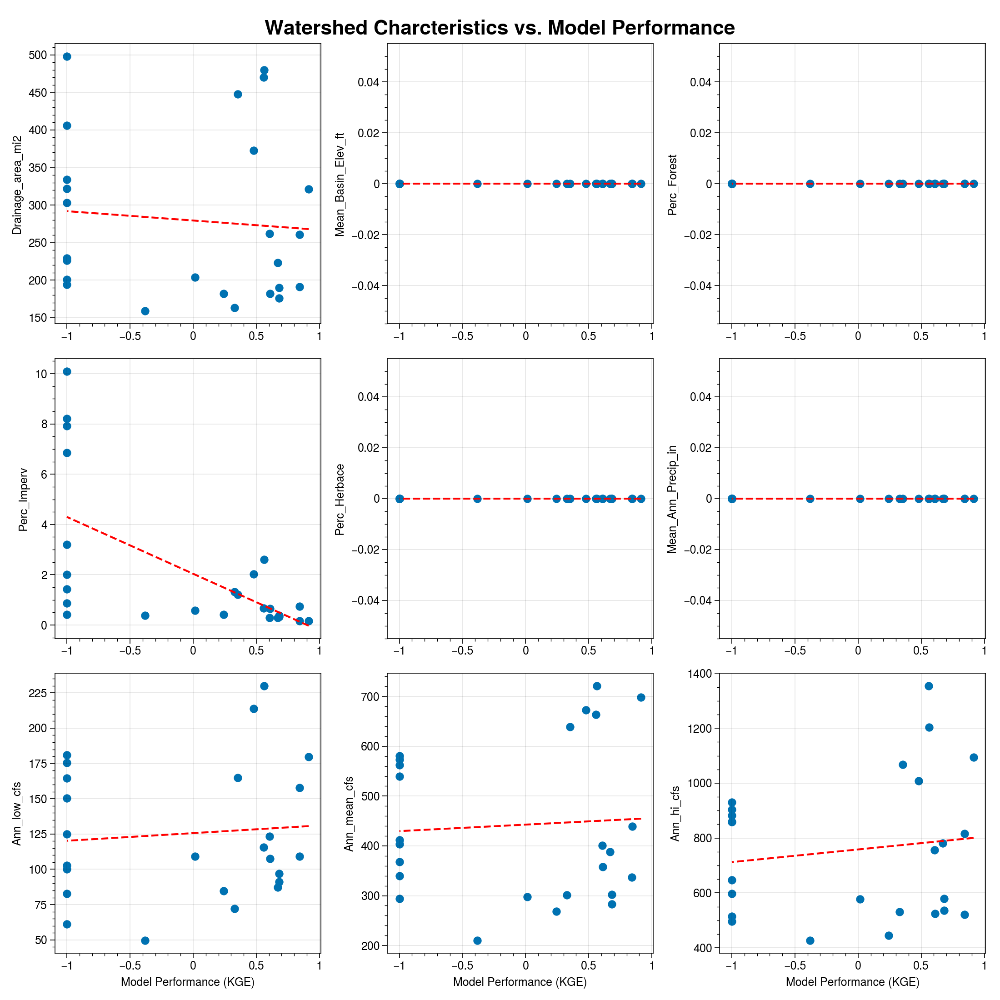

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_03574500                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_19621426 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02377570                  :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_2171465 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02427250                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21457950 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02415000                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_22035157 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02374500                    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_933140017 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                                       :Text   [x,y]
      .Text.II                                      :Text   [x,y]
      .Text.III                                     :Text   [x,y]
      .Text.IV                                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02464000                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_18229143 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02453000                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_18591938 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02408540                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_22274612 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02404400                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_22204871 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02373000                  :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_2402121 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_03575100                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_19621328 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02412000                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_15810691 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_03586500                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_19581387 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02374745                  :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_2413254 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02422500                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21676818 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02448900                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_18604744 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02423555                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21655896 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02423500                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21656498 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02363000                  :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_2210130 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02413300                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_15811667 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02423496                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21655568 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02455000                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_18563487 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02405500                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_22206103 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02342500                  :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_3435970 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_02423425                   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.NWM_v2_full_stop_1_colon_NHD_21655464 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (NWM_v2.1 Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

In [5]:

State_Eval.Interactive_Model_Eval('Q', supply = True)

Use State_Eval.Eval.NWIS_site_id if you would like to get the respective NWIS/Modeled site/reaches to plug into the Reach Evaluator class

# Streamflow evaluation: HUC Class

This section of code allows the user to evaluate modeled streamflow with observed in situ NWIS monitoring sites 
for a watershed(s) of interest. The user can input multiple watersheds (e.g., Great Salt lake: ['1601', '1602']).
Enter a start date, end date, watersheds and model to compare (NWM v2.1 is set up).
NWM retrospective data spans from 1980 - 2020, USGS/NWIS data is location dependent

Use [The National Map Watershed Boundary Dataset (WBD)]() to identify the HUC size and unit code of interestto locate HUC of interest.

![HUC_Eval_top](https://user-images.githubusercontent.com/33735397/206322410-ea0e210c-c805-4599-ad6b-704c76ba42ce.PNG)


In [17]:
#Enter a starting date, model for evaluation, and the respectrive HUC id(s)

startDT ='2015-4-01'
endDT ='2015-10-31'
model = 'NWM_v2.1'
HUCids = ['1601', '1602'] #must be in brackets, add multiple HUCs to complete a watershed (e.g. GSL basin), East vs. West. etc
#0802 causing issues, is the state there?
#Initiate function
HUC_Eval = ROSET_AWS.HUC_Eval(model, HUCids, startDT, endDT, cwd)


In [18]:
#Match NWIS locations within HUC watershed
HUC_Eval.Join_WBD_StreamStats()

Getting geospatial information for HUC:  ['1601', '1602']
['1601', '1602']
No AWS access, trying local directory
Found data in local directory
No AWS access, trying local directory
Found data in local directory
Finding NWIS monitoring stations within  ['1601', '1602']  watershed boundary
Creating dataframe of NWIS stations within  ['1601', '1602']  watershed boundary


In [19]:
#Get NWM reaches for each NWIS monitoring station
HUC_Eval.get_NHD_Model_info()

#Get NWM and NWIS data to compare
HUC_Eval.prepare_comparison() # run the apply function to not have to run it during evaluation

Getting collocated  NWM_v2.1  NHD reaches with NWIS monitoring locations


Getting  NWM_v2.1  data


100% |########################################################################|


Getting NWIS data


100% |########################################################################|


## Interactive plotting on map
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

In [22]:
#Run Map function
HUC_Eval.Map_Plot_Eval('D', supply = True)

Plotting monitoring station locations


## Interactive time series plotting
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

,NWIS_site_id,NHD_reachid,Location,RMSE,MaxError,MAPE,KGE,Drainage_area_mi2,Mean_Basin_Elev_ft,Perc_Forest,Perc_Imperv,Perc_Herbace,Mean_Ann_Precip_in,Ann_low_cfs,Ann_mean_cfs,Ann_hi_cfs,name,huc4
0,10011500,7887898,BEAR RIVER NEAR UTAH-WYOMING STATE LINE,93,289,45.076355,0.750627,174.0000,9720.0,67.70,0.12000,2.94,34.8,80.800,193.0,368.10,Bear,1601
1,10154200,10373692,"PROVO RIVER NEAR WOODLAND, UT",125,380,90.114978,0.641305,0.0000,0.0,0.00,0.00000,0.00,0.0,71.100,211.0,352.60,Great Salt Lake,1602
2,10155000,10373622,"PROVO RIVER NEAR HAILSTONE, UT",205,828,195.710211,0.527786,229.0000,8640.0,74.40,0.13000,3.19,29.6,81.900,273.0,449.00,Great Salt Lake,1602
3,10149400,10349220,"DIAMOND FORK ABV RED HOLLOW NR THISTLE, UT",20,94,25.284613,0.506288,97.0000,7420.0,59.20,0.01680,3.91,25.3,37.700,82.0,154.90,Great Salt Lake,1602
4,10131000,10093066,"CHALK CREEK AT COALVILLE, UT",30,97,218.642345,0.464076,249.0000,7540.0,49.40,0.11000,11.00,23.2,13.600,72.0,198.10,Great Salt Lake,1602
5,10172870,10683178,"TROUT CREEK NEAR CALLAO, UT",4,19,108.382026,0.439629,8.2000,9250.0,66.90,0.00000,0.35,23.2,1.450,5.0,15.80,Great Salt Lake,1602
6,10128500,10093110,"WEBER RIVER NEAR OAKLEY, UT",143,473,43.616345,0.429414,0.1300,7320.0,44.30,0.00000,29.60,22.5,78.200,205.0,373.50,Great Salt Lake,1602
7,10153100,10348934,"HOBBLE CREEK AT 1650 WEST AT SPRINGVILLE, UTAH",21,55,86.886327,0.423816,0.0000,0.0,0.00,0.00000,0.00,0.0,20.100,39.0,99.90,Great Salt Lake,1602
8,10109000,664424,"LOGAN RIVER ABOVE STATE DAM, NEAR LOGAN, UT",124,497,48.008133,0.394594,214.0000,7550.0,38.50,0.09870,16.30,35.5,90.000,227.0,454.60,Bear,1601
9,10146000,10330245,"SALT CREEK AT NEPHI, UT",3,12,20.118542,0.348732,95.7000,7360.0,48.30,0.11000,7.72,21.8,5.430,19.0,39.80,Great Salt Lake,1602


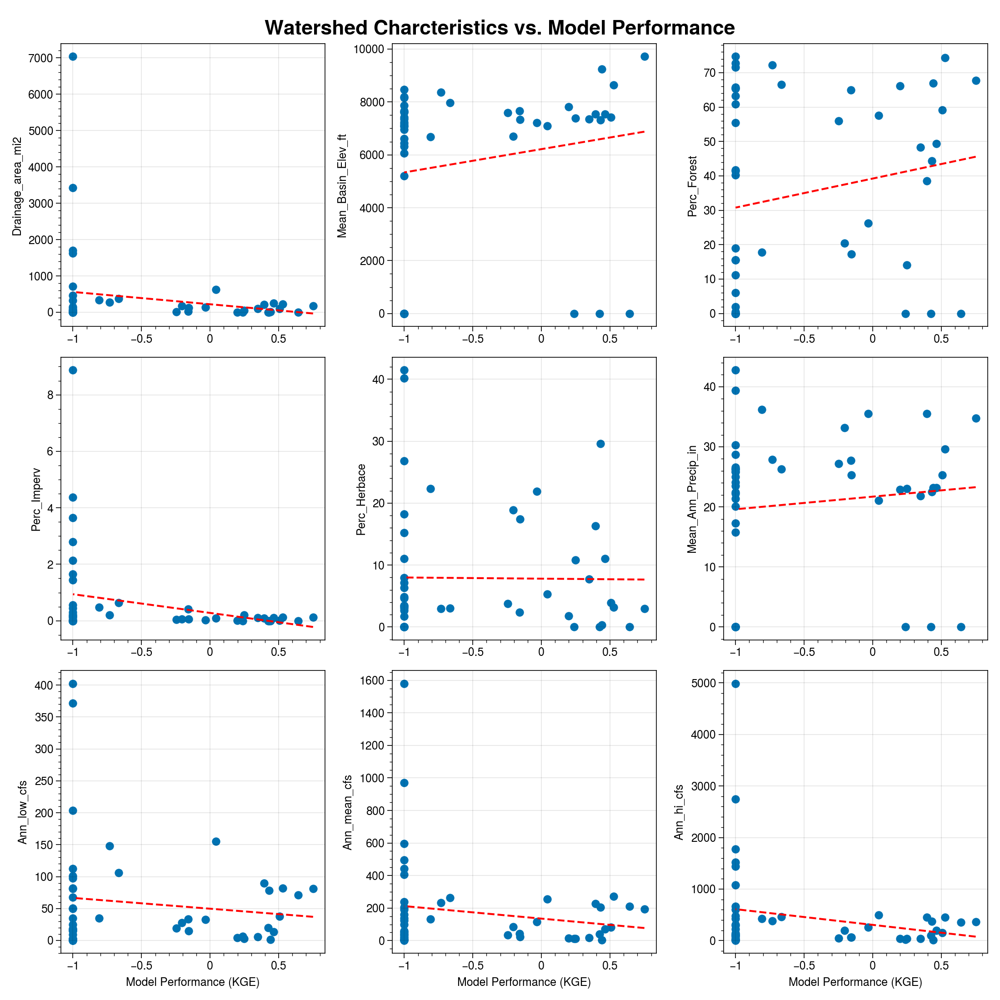

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10011500                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_7887898 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10154200                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10373692 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10155000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10373622 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10149400                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10349220 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10131000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10093066 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10172870                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10683178 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10128500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10093110 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10153100                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10348934 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10109000                 :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_664424 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                              :Rectangles   [x0,y0,x1,y1]
      .Text.I                                    :Text   [x,y]
      .Text.II                                   :Text   [x,y]
      .Text.III                                  :Text   [x,y]
      .Text.IV                                   :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10146000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10330245 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10023000                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_7880800 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10133600                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10276878 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10145400                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10331031 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10150500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10349360 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10137500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10274270 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10132500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10089426 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10156000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10375650 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10105900                 :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_666170 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                              :Rectangles   [x0,y0,x1,y1]
      .Text.I                                    :Text   [x,y]
      .Text.II                                   :Text   [x,y]
      .Text.III                                  :Text   [x,y]
      .Text.IV                                   :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10149000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10349162 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10155500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10375648 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10155200                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10373794 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10140700                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10274376 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10132000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10093052 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10168000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10389562 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10126000                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_4605050 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10134500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10277268 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10133800                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10276836 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10172800                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10395905 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10133650                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10276856 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10140100                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10275828 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10164500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10329013 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10133980                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10276712 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10136500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10274616 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10130500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10092262 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10129500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10093214 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10172952                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_1169706 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10146400                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10331001 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10113500                 :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_666156 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                              :Rectangles   [x0,y0,x1,y1]
      .Text.I                                    :Text   [x,y]
      .Text.II                                   :Text   [x,y]
      .Text.III                                  :Text   [x,y]
      .Text.IV                                   :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10129900                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10093082 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10172700                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10396937 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10163000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10376596 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10166430                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10327201 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10092700                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_4560060 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10068500                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_4472049 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10141000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10273232 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10171000                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10390290 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10039500                  :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_7898927 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                               :Rectangles   [x0,y0,x1,y1]
      .Text.I                                     :Text   [x,y]
      .Text.II                                    :Text   [x,y]
      .Text.III                                   :Text   [x,y]
      .Text.IV                                    :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10172727                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10396113 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10157500                   :Curve   [DateTime]   (Discharge (cfs))
      .Curve.NWM_v2_full_stop_1_colon_NHD_10375690 :Curve   [DateTime]   (Discharge (cfs))
      .Rectangles.I                                :Rectangles   [x0,y0,x1,y1]
      .Text.I                                      :Text   [x,y]
      .Text.II                                     :Text   [x,y]
      .Text.III                                    :Text   [x,y]
      .Text.IV                                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (cfs)]   (NWM_v2.1 Discharge (cfs))
      .Curve.I   :Curve   [x]   (y)

In [24]:
#Plot evaluation
HUC_Eval.Interactive_Model_Eval('D', supply = False)

# Streamflow Evaluation: Reach Class

This section of code allows the user to evaluate modeled streamflow with selected NWIS monitoring sites of interest. 
The user can input multiple USGS sites (e.g., ['02378780', '02339495', '02342500'])
Please enter a start date, end date, and model to compare (NWM v2.1 is set up).
NWM retrospective data spans from 1980 - 2020, USGS/NWIS data is location dependent.

![REach_Eval_top](https://user-images.githubusercontent.com/33735397/206324095-dcc59508-bf4c-43a8-9a19-4fc5c573e205.PNG)

In [2]:
#Put in model of interest for evaluation, NWIS/USGS site id(s), and the start/end date

model = 'XGBoost'
#example with list of USGS sites along the Provo River, Utah
#NWIS_list = ['10155000', '10155200'] #, '10155500', '10155200', '10154200']
NWIS_list = ['10126000', '10130500', '10134500', '10136500', '10137500', '10141000', '10155000', '10164500', '10171000' ] # 02450000 is a bad site and good for breaking ROSET
#plot list of top performing sites
Eval_Metric = 'KGE'
#Performance_Threshold = 0.70
#NWIS_list = HUC_Eval.Eval[HUC_Eval.Eval[Eval_Metric] >Performance_Threshold]['NWIS_site_id'].values.tolist()

startDT ='2020-1-01'
endDT ='2020-9-30'
#set path directory
cwd = os.getcwd()


Reach_Eval = ROSET_AWS.Reach_Eval(model , NWIS_list, startDT, endDT, cwd)

#Get Streamstats and colocated NHD reaches
Reach_Eval.get_NHD_Model_info()

#Get USGS and NWM data
Reach_Eval.prepare_comparison()

Getting geospatial information for NHD reaches


Dropping USGS sites with no NHD reach
Getting  XGBoost  data
Getting data for XGBoost:  4605050
Getting data for XGBoost:  10092262
Getting data for XGBoost:  10277268


Getting data for XGBoost:  10274616
Getting data for XGBoost:  10274270
Getting data for XGBoost:  10273232
Getting data for XGBoost:  10373622


100% |########################################################################|


Getting data for XGBoost:  10329013
Getting data for XGBoost:  10390290
Getting NWIS data


100% |########################################################################|


## Interactive plotting on map
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

In [3]:
#Plot the locations
Reach_Eval.Map_Plot_Eval('D', supply = True)

Plotting monitoring station locations


## Interactive time series plotting
Set frequency for graph:
* <span style="color:red">'D'</span>: Daily
* <span style="color:red">'M'</span>: monthly, 
* <span style="color:red">'Q'</span>: quarterly, 
* <span style="color:red">'A'</span>: annual

Set supply = <span style="color:green"> **True** </span> to evaluate cumulative water year totals or <span style = "color:green"> **False** </span> to look at desired temporal resolution

,NWIS_site_id,NHD_reachid,Location,RMSE,MaxError,MAPE,KGE,Drainage_area_mi2,Mean_Basin_Elev_ft,Perc_Forest,Perc_Imperv,Perc_Herbace,Mean_Ann_Precip_in,Ann_low_cfs,Ann_mean_cfs,Ann_hi_cfs
0,10134500,10277268,"EAST CANYON CREEK NEAR MORGAN, UT",6012,8867,68.563217,0.713999,152.0,7090.0,60.9,1.6500,4.68,25.8,18.7,60.0,148.4
1,10164500,10329013,AMERICAN FK AB UPPER POWERPLANT NR AMERICAN FK...,4559,9715,71.550570,0.671491,51.1,8470.0,71.5,0.0173,3.42,39.4,16.8,53.0,111.8
2,10141000,10273232,"WEBER RIVER NEAR PLAIN CITY, UT",16652,35256,40.066630,0.671143,NaN,NaN,NaN,NaN,NaN,NaN,50.3,441.0,1522.0
3,10130500,10092262,"WEBER RIVER NEAR COALVILLE, UT",12617,23416,74.258012,0.577482,NaN,NaN,NaN,NaN,NaN,NaN,81.9,204.0,479.2
4,10137500,10274270,"SOUTH FORK OGDEN RIVER NEAR HUNTSVILLE, UT",9980,14895,51.859815,0.568166,137.0,7220.0,26.3,0.0253,21.90,35.5,32.6,115.0,259.2
5,10136500,10274616,"WEBER RIVER AT GATEWAY, UT",33686,56043,168.995210,0.530391,1620.0,7170.0,40.2,0.4400,11.00,25.8,112.8,496.0,1444.0
6,10155000,10373622,"PROVO RIVER NEAR HAILSTONE, UT",50285,72510,65.925369,0.436327,229.0,8640.0,74.4,0.1300,3.19,29.6,81.9,273.0,449.0
7,10126000,4605050,"BEAR RIVER NEAR CORINNE, UT",177923,248638,33.000306,0.425790,7040.0,6620.0,15.6,0.5500,15.20,22.2,402.5,1581.0,4989.0
8,10171000,10390290,"JORDAN RIVER @ 1700 SOUTH @ SALT LAKE CITY, UT",29637,52018,87.792436,0.209796,3430.0,6440.0,41.7,4.3700,6.35,21.4,100.9,138.0,225.2


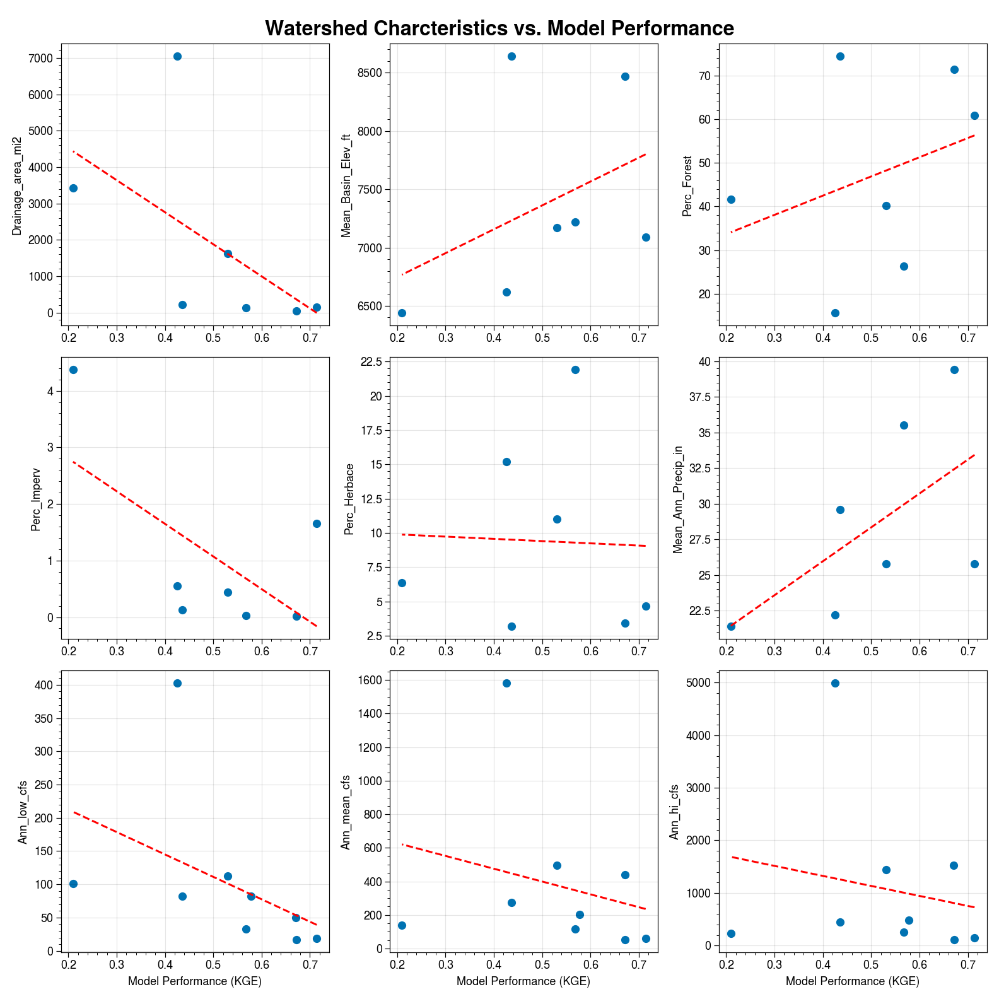

EAST CANYON CREEK NEAR MORGAN, UT


,USGS: 10134500,XGBoost: 10277268
Datetime,,
2020-01-31,691.063106,1258.353458
2020-02-29,1363.874349,3224.260610
2020-03-31,4295.944332,12160.753191
2020-04-30,10160.557365,16224.440996
2020-05-31,12204.925012,20889.713167
2020-06-30,17304.804364,23577.464083
2020-07-31,24327.103162,26532.068670
2020-08-31,32077.637959,27117.081694
2020-09-30,37125.845726,28258.371357


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10134500    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10277268 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

AMERICAN FK AB UPPER POWERPLANT NR AMERICAN FK, UT


,USGS: 10164500,XGBoost: 10329013
Datetime,,
2020-01-31,795.019815,742.364187
2020-02-29,1537.203013,2003.092712
2020-03-31,2426.929609,9075.452136
2020-04-30,4018.309825,13733.451312
2020-05-31,9089.445977,15655.122270
2020-06-30,14439.949699,16667.356208
2020-07-31,17520.591150,17646.219557
2020-08-31,18737.158646,18512.861428
2020-09-30,19582.772753,19243.772634


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10164500    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10329013 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

WEBER RIVER NEAR PLAIN CITY, UT


,USGS: 10141000,XGBoost: 10273232
Datetime,,
2020-01-31,12061.275203,35128.607635
2020-02-29,34508.457025,69764.417402
2020-03-31,66769.574062,86535.333320
2020-04-30,91441.946325,89147.459902
2020-05-31,97910.994276,94027.732639
2020-06-30,104240.773670,96034.652620
2020-07-31,108541.181853,97531.177957
2020-08-31,111863.213701,105796.040766
2020-09-30,119719.359277,128895.140064


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10141000    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10273232 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

WEBER RIVER NEAR COALVILLE, UT


,USGS: 10130500,XGBoost: 10092262
Datetime,,
2020-01-31,2367.371551,7940.711369
2020-02-29,6368.849578,19921.020483
2020-03-31,18509.477866,28355.889245
2020-04-30,23335.157978,34680.354707
2020-05-31,28176.962338,41429.952477
2020-06-30,41010.525240,44417.637937
2020-07-31,52769.735922,47980.404481
2020-08-31,64956.737490,49663.483025
2020-09-30,77195.360652,53779.564147


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10130500    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10092262 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

SOUTH FORK OGDEN RIVER NEAR HUNTSVILLE, UT


,USGS: 10137500,XGBoost: 10274270
Datetime,,
2020-01-31,1955.532783,3413.678895
2020-02-29,3992.262636,10492.319829
2020-03-31,10333.489704,19938.317742
2020-04-30,23711.551409,25769.635273
2020-05-31,38118.379124,29659.455676
2020-06-30,42512.740229,32111.234741
2020-07-31,47127.478667,34516.149915
2020-08-31,51589.263823,37626.372088
2020-09-30,54669.346959,39774.645461


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10137500    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10274270 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

WEBER RIVER AT GATEWAY, UT


,USGS: 10136500,XGBoost: 10274616
Datetime,,
2020-01-31,3647.653783,23229.054926
2020-02-29,8108.565134,64151.995521
2020-03-31,32163.324226,83526.063090
2020-04-30,60290.113753,94403.724242
2020-05-31,87034.834833,105059.178782
2020-06-30,109331.046522,111745.738872
2020-07-31,132278.632385,115740.881379
2020-08-31,155969.409309,121333.291150
2020-09-30,172568.485894,139662.021578


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10136500    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10274616 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

PROVO RIVER NEAR HAILSTONE, UT


,USGS: 10155000,XGBoost: 10373622
Datetime,,
2020-01-31,5261.741773,7350.371210
2020-02-29,10299.652399,18953.698520
2020-03-31,17949.000150,50292.503637
2020-04-30,34054.570796,69315.046541
2020-05-31,134463.094834,90403.615831
2020-06-30,173327.601455,100817.475711
2020-07-31,176631.665710,108270.698426
2020-08-31,178623.824675,111210.776673
2020-09-30,180945.402533,117923.395958


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10155000    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10373622 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

BEAR RIVER NEAR CORINNE, UT


,USGS: 10126000,XGBoost: 4605050
Datetime,,
2020-01-31,89206.495168,121294.215533
2020-02-29,181723.304248,209660.076131
2020-03-31,338843.830101,256560.648351
2020-04-30,456117.623388,286577.929381
2020-05-31,531465.098664,313086.143028
2020-06-30,589257.764805,340619.827904
2020-07-31,615152.913974,366780.922120
2020-08-31,630196.486154,411890.157140
2020-09-30,654324.690391,484828.928242


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10126000   :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_4605050 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                :Rectangles   [x0,y0,x1,y1]
      .Text.I                      :Text   [x,y]
      .Text.II                     :Text   [x,y]
      .Text.III                    :Text   [x,y]
      .Text.IV                     :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

JORDAN RIVER @ 1700 SOUTH @ SALT LAKE CITY, UT


,USGS: 10171000,XGBoost: 10390290
Datetime,,
2020-01-31,7238.652307,20761.481768
2020-02-29,14086.060777,32648.961299
2020-03-31,20102.674854,41812.252441
2020-04-30,28805.896619,52165.612259
2020-05-31,39346.491793,64360.542079
2020-06-30,49387.180897,75899.552371
2020-07-31,60637.091066,87469.179211
2020-08-31,70970.442375,111050.528067
2020-09-30,80688.553636,132706.516824


:Layout
   .Overlay.I  :Overlay
      .Curve.USGS_colon_10171000    :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Curve.XGBoost_colon_10390290 :Curve   [DateTime]   (Discharge (Acre-Feet))
      .Rectangles.I                 :Rectangles   [x0,y0,x1,y1]
      .Text.I                       :Text   [x,y]
      .Text.II                      :Text   [x,y]
      .Text.III                     :Text   [x,y]
      .Text.IV                      :Text   [x,y]
   .Overlay.II :Overlay
      .Scatter.I :Scatter   [ Observed Discharge (Acre-Feet)]   (XGBoost Discharge (Acre-Feet))
      .Curve.I   :Curve   [x]   (y)

In [5]:
#Holoviews plots.
freq = 'M'

Reach_Eval.Interactive_Model_Eval(freq, supply =True)